# Capstone Project - Final
#### Import Libraries

In [1]:
!pip install geocoder
!pip install geopy
!pip install folium

In [2]:
import pandas as pd
import requests
import numpy as np
import geocoder
import geopy
import folium
import requests 
import matplotlib.cm as cm
import matplotlib.colors as colors
import json
import xml
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from pandas.io.json import json_normalize 
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim 
from bs4 import BeautifulSoup

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print("imported")

imported


#### Data Extraction
Web Scraping of Postal Codes from Wikipedia with Beautiful Soup
<br>
Wikipedia Link: https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M

In [3]:
source = requests.get("https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M")
soup = BeautifulSoup(source.text,'lxml')

In [4]:
data = []
table = soup.find(class_='wikitable')
index=0
for tr in table.find_all('tr'):
    index += 1
    if index>1:
        section = [] 
        for td in tr.find_all('td'):
            section.append(td.text.rstrip())
        data.append(section)

In [5]:
df = pd.DataFrame(data = data,columns=['Postcode','Borough','Neighbourhood'])
df.head()

,Postcode,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


In [6]:
#drop the rows that have 'not assigned' in the borough column

df = df[df.Borough!='Not assigned']

df['Neighbourhood'].replace("not assigned",df['Borough'],inplace=True)

df.head()

,Postcode,Borough,Neighbourhood
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"
5,M6A,North York,"Lawrence Manor, Lawrence Heights"
6,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


In [7]:
df.shape

(103, 3)

In [8]:
# clean dataframe 
df = df[df.Borough!='Not assigned']
df = df[df.Borough!= 0]
df.reset_index(drop = True, inplace = True)
i = 0
for i in range(0,df.shape[0]):
    if df.iloc[i][2] == 'Not assigned':
        df.iloc[i][2] = df.iloc[i][1]
        i = i+1

In [9]:
df2 = df.groupby(['Postcode','Borough'])['Neighbourhood'].apply(', '.join).reset_index()
df2.head()

,Postcode,Borough,Neighbourhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


In [10]:
def neighbourhood_list(grouped):    
    return ', '.join(sorted(grouped['Neighbourhood'].tolist()))
                    
grp = df2.groupby(['Postcode', 'Borough'])
df3 = grp.apply(neighbourhood_list).reset_index(name='Neighbourhood')

In [11]:
print(df3.shape)
df3.head()

(103, 3)


,Postcode,Borough,Neighbourhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


In [12]:
def get_latilong(postal_code):
    lati_long_coords = None
    while(lati_long_coords is None):
        g = geocoder.arcgis('{}, Toronto, Ontario'.format(postal_code))
        lati_long_coords = g.latlng
    return lati_long_coords
    
get_latilong('M4G')

[43.70909000000006, -79.36409999999995]

In [13]:
# Retrieve Postal Code Co-ordinates
postal_codes = df3['Postcode']    
coords = [ get_latilong(postal_code) for postal_code in postal_codes.tolist() ]

In [14]:
# Add Columns Latitude & Longitude
df_coords = pd.DataFrame(coords, columns=['Latitude', 'Longitude'])
df3['Latitude'] = df_coords['Latitude']
df3['Longitude'] = df_coords['Longitude']

In [15]:
df3[df3.Postcode == 'M5G']

,Postcode,Borough,Neighbourhood,Latitude,Longitude
57,M5G,Downtown Toronto,Central Bay Street,43.65609,-79.38493


In [16]:
df3.head()

,Postcode,Borough,Neighbourhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern, Rouge",43.81153,-79.19552
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.78564,-79.15871
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.76575,-79.17520
3,M1G,Scarborough,Woburn,43.76820,-79.21761
4,M1H,Scarborough,Cedarbrae,43.76969,-79.23944


In [17]:
address = 'Scarborough, Toronto'

geolocator = Nominatim(user_agent='Toronto_agent')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('the geographical co-ordinates (latitude/longitude) of Seattle, Washington are {}, {}.'.format(latitude, longitude))

the geographical co-ordinates (latitude/longitude) of Seattle, Washington are 43.773077, -79.257774.


#### Map of Scarborough

In [18]:
map_Scarborough = folium.Map(location=[latitude, longitude], zoom_start=10)

for lat, lng, nei in zip(df3['Latitude'], df3['Longitude'], df3['Neighbourhood']):
    
    label = '{}'.format(nei)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Scarborough)  
    
map_Scarborough

In [19]:
address = 'Scarborough,Toronto'

geolocator = Nominatim(user_agent='Toronto_agent')
location = geolocator.geocode(address)
latitude_1 = location.latitude
longitude_1 = location.longitude
print('the geograpical co-ordinates of neighbourhood one are {}, {}.'.format(latitude, longitude))

the geograpical co-ordinates of neighbourhood one are 43.773077, -79.257774.


In [20]:
CLIENT_ID = '2TY0SUFFEHHC2P2K4HOU3POSOUE2RJPOFK531WUMOWSPBY2X' # your Foursquare ID
CLIENT_SECRET = 'Z0GSSOXDJ3SXUCT5CXC3IM3GC2IVBELN1SF0IV5STAUK11L2' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 30

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 2TY0SUFFEHHC2P2K4HOU3POSOUE2RJPOFK531WUMOWSPBY2X
CLIENT_SECRET:Z0GSSOXDJ3SXUCT5CXC3IM3GC2IVBELN1SF0IV5STAUK11L2


In [21]:
radius = 700 
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_1, 
   longitude_1, 
    radius, 
   LIMIT)
results = requests.get(url).json()

#### Getting Nearby Venues

In [22]:
venues=results['response']['groups'][0]['items']
nearbyvenues = json_normalize(venues)
nearbyvenues.columns

Index(['referralId', 'reasons.count', 'reasons.items', 'venue.id',
       'venue.name', 'venue.location.address', 'venue.location.crossStreet',
       'venue.location.lat', 'venue.location.lng',
       'venue.location.labeledLatLngs', 'venue.location.distance',
       'venue.location.postalCode', 'venue.location.cc', 'venue.location.city',
       'venue.location.state', 'venue.location.country',
       'venue.location.formattedAddress', 'venue.categories',
       'venue.photos.count', 'venue.photos.groups',
       'venue.location.neighborhood', 'venue.events.count',
       'venue.events.summary', 'venue.venuePage.id'],
      dtype='object')

In [23]:
def get_category_type(row):
    try:
        categorieslist = row['categories']
    except:
        categorieslist = row['venue.categories']
        
    if len(categorieslist) == 0:
        return None
    else:
        return categorieslist[0]['name']

In [24]:
filteredcolumns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearbyvenues = nearbyvenues.loc[:, filteredcolumns]

# filter the category for each row
nearbyvenues['venue.categories'] = nearbyvenues.apply(get_category_type, axis=1)

# clean columns
nearbyvenues.columns = [col.split(".")[-1] for col in nearbyvenues.columns]

nearbyvenues.head()
nearbyvenues

,name,categories,lat,lng
0,SEPHORA,Cosmetics Shop,43.775017,-79.258109
1,American Eagle Store,Clothing Store,43.776012,-79.258334
2,Disney Store,Toy / Game Store,43.775537,-79.256833
3,DAVIDsTEA,Tea Room,43.776320,-79.258688
4,Chipotle Mexican Grill,Mexican Restaurant,43.776410,-79.258069
5,St. Andrews Fish & Chips,Fish & Chips Shop,43.771865,-79.252645
6,Tommy Hilfiger,Clothing Store,43.776015,-79.257369
7,St. Louis Bar & Grill,Bar,43.774157,-79.253808
8,Shoppers Drug Mart,Pharmacy,43.773305,-79.251662
9,Hot Topic,Clothing Store,43.775450,-79.257929


In [25]:
# Top 10 Categories
a=pd.Series(nearbyvenues.categories)
a.value_counts()[:10]

Clothing Store       8
Coffee Shop          5
Restaurant           4
Gas Station          2
Tea Room             2
Pharmacy             2
Electronics Store    2
Sandwich Place       2
Supermarket          1
Fish & Chips Shop    1
Name: categories, dtype: int64

In [26]:

def getNearbyVenues(names, latitudes, longitudes, radius=700):
    
    venueslist=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # making GET request
        venueresults = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venueslist.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in venueresults])

    nearbyvenues = pd.DataFrame([item for venuelist in venueslist for item in venuelist])
    nearbyvenues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearbyvenues)

In [27]:
# Nearby Venues
scarboroughvenues = getNearbyVenues(names=df3['Neighbourhood'],
                                   latitudes=df3['Latitude'],
                                   longitudes=df3['Longitude']
                                  )

Malvern, Rouge
Rouge Hill, Port Union, Highland Creek
Guildwood, Morningside, West Hill
Woburn
Cedarbrae
Scarborough Village
Kennedy Park, Ionview, East Birchmount Park
Golden Mile, Clairlea, Oakridge
Cliffside, Cliffcrest, Scarborough Village West
Birch Cliff, Cliffside West
Dorset Park, Wexford Heights, Scarborough Town Centre
Wexford, Maryvale
Agincourt
Clarks Corners, Tam O'Shanter, Sullivan
Milliken, Agincourt North, Steeles East, L'Amoreaux East
Steeles West, L'Amoreaux West
Upper Rouge
Hillcrest Village
Fairview, Henry Farm, Oriole
Bayview Village
York Mills, Silver Hills
Willowdale, Newtonbrook
Willowdale, Willowdale East
York Mills West
Willowdale, Willowdale West
Parkwoods
Don Mills
Don Mills
Bathurst Manor, Wilson Heights, Downsview North
Northwood Park, York University
Downsview
Downsview
Downsview
Downsview
Victoria Village
Parkview Hill, Woodbine Gardens
Woodbine Heights
The Beaches
Leaside
Thorncliffe Park
East Toronto, Broadview North (Old East York)
The Danforth West, 

In [28]:
print('amount of unique categories: {}.'.format(len(scarboroughvenues['Venue Category'].unique())))
scarboroughvenues.groupby('Neighbourhood').count().head()

amount of unique categories: 301.


,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Agincourt,31,31,31,31,31,31
"Alderwood, Long Branch",11,11,11,11,11,11
"Bathurst Manor, Wilson Heights, Downsview North",4,4,4,4,4,4
Bayview Village,4,4,4,4,4,4
"Bedford Park, Lawrence Manor East",27,27,27,27,27,27


#### One Hot Encoding

In [29]:
scarborough_onehot = pd.get_dummies(scarboroughvenues[['Venue']],prefix="",prefix_sep="")
scarborough_onehot['Neighbourhood']=scarboroughvenues['Neighbourhood']

scarborough_onehot.head()

2 Bros Cuisine  215 Fort York Blvd. 3rd floor Gym  241 Pizza  \
0               0                                  0          0   
1               0                                  0          0   
2               0                                  0          0   
3               0                                  0          0   
4               0                                  0          0   

   306 Yonge Street - Jordan Store  401 Games  401 Richmond  \
0                                0          0             0   
1                                0          0             0   
2                                0          0             0   
3                                0          0             0   
4                                0          0             0   

   5 Elements Espresso  7 West Cafe  7-Eleven  84 Sheppard Bus At Jane  \
0                    0            0         0                        0   
1                    0            0         0                        0   
2                    0            0         0                        0   
3                    0            0         0                        0   
4                    0            0         0                        0   

   900 Mount Pleasant - Residents Gym  A & C World  A Dark Horse  A Good Read  \
0                                   0            0             0            0   
1                                   0            0             0            0   
2                                   0            0             0            0   
3                                   0            0             0            0   
4                                   0            0             0            0   

   A K Sports Cards & Comics  A Nerd's World  A&W  AMJ Painting  ASAP City  \
0                          0               0    0             0          0   
1                          0               0    0             0          0   
2                          0               0    0             0          0   
3                          0               0    0             1          0   
4                          0               0    0             0          0   

   Abercrombie & Fitch  Aboveground Art Supplies  Absolute Bakery & Café  \
0                    0                         0                       0   
1                    0                         0                       0   
2                    0                         0                       0   
3                    0                         0                       0   
4                    0                         0                       0   

   Aburi Room  Access Fine Art  Actinolite  Adelaide Club Toronto  \
0           0                0           0                      0   
1           0                0           0                      0   
2           0                0           0                      0   
3           0                0           0                      0   
4           0                0           0                      0   

   Afilias Canada  Agincourt Bakery  Agincourt Park  \
0               0                 0               0   
1               0                 0               0   
2               0                 0               0   
3               0                 0               0   
4               0                 0               0   

   Agincourt Recreation Centre  Air Canada Club  Ajisen Ramen 味千ラーメン  \
0                            0                0                    0   
1                            0                0                    0   
2                            0                0                    0   
3                            0                0                    0   
4                            0                0                    0   

   Akai Sushi  Aki Studio Theatre  Akira Back  Alderwood Pool  \
0           0                   0           0               0   
1           0                   0           0         

In [30]:
scarborough_grouped = scarborough_onehot.groupby('Neighbourhood').mean().reset_index()
scarborough_grouped

Neighbourhood  2 Bros Cuisine  \
0                                           Agincourt        0.000000   
1                              Alderwood, Long Branch        0.000000   
2     Bathurst Manor, Wilson Heights, Downsview North        0.000000   
3                                     Bayview Village        0.000000   
4                   Bedford Park, Lawrence Manor East        0.000000   
5                                         Berczy Park        0.000000   
6                         Birch Cliff, Cliffside West        0.000000   
7        Brockton, Parkdale Village, Exhibition Place        0.000000   
8   Business reply mail Processing Centre, South C...        0.000000   
9   CN Tower, King and Spadina, Railway Lands, Har...        0.000000   
10                                Caledonia-Fairbanks        0.000000   
11              Canada Post Gateway Processing Centre        0.000000   
12                                          Cedarbrae        0.000000   
13                                 Central Bay Street        0.000000   
14                                           Christie        0.000000   
15                               Church and Wellesley        0.000000   
16            Clarks Corners, Tam O'Shanter, Sullivan        0.000000   
17    Cliffside, Cliffcrest, Scarborough Village West        0.000000   
18                     Commerce Court, Victoria Hotel        0.000000   
19                                         Davisville        0.000000   
20                                   Davisville North        0.000000   
21   Del Ray, Mount Dennis, Keelsdale and Silverthorn        0.000000   
22                                          Don Mills        0.000000   
23  Dorset Park, Wexford Heights, Scarborough Town...        0.000000   
24                                          Downsview        0.000000   
25                       Dufferin, Dovercourt Village        0.000000   
26      East Toronto, Broadview North (Old East York)        0.000000   
27  Eringate, Bloordale Gardens, Old Burnhamthorpe...        0.000000   
28                       Fairview, Henry Farm, Oriole        0.000000   
29             First Canadian Place, Underground city        0.000000   
30    Forest Hill North & West, Forest Hill Road Park        0.000000   
31                           Garden District, Ryerson        0.000000   
32                                          Glencairn        0.000000   
33                    Golden Mile, Clairlea, Oakridge        0.000000   
34                  Guildwood, Morningside, West Hill        0.000000   
35  Harbourfront East, Union Station, Toronto Islands        0.000000   
36                      High Park, The Junction South        0.000000   
37                                  Hillcrest Village        0.000000   
38                                      Humber Summit        0.000000   
39                                   Humberlea, Emery        0.000000   
40                                 Humewood-Cedarvale        0.000000   
41                     India Bazaar, The Beaches West        0.000000   
42            Islington Avenue, Humber Valley Village        0.000000   
43        Kennedy Park, Ionview, East Birchmount Park        0.000000   
44          Kensington Market, Chinatown, Grange Park        0.000000   
45  Kingsview Village, St. Phillips, Martin Grove ...        0.000000   
46                   Lawrence Manor, Lawrence Heights        0.000000   
47                                      Lawrence Park        0.000000   
48                                            Leaside        0.000000   
49                           Little Portugal, Trinity        0.000000   
50                                     Malvern, Rouge        0.000000   
51  Milliken, Agincourt North, Steeles East, L'Amo...        0.000000   
52  Mimico NW, The Queensway West, South of Bloor,...        0.000000   
53                        Moore Park, Summerhill East        0.000000   
54       New Toronto, Mim

In [31]:
num_top_venues = 5
for hood in scarborough_grouped['Neighbourhood']:
    print("---- "+hood+" ----")
    temp =scarborough_grouped[scarborough_grouped['Neighbourhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

---- Agincourt ----
                                       venue  freq
0                               Sushi Legend  0.03
1  Grandeur Palace 華丽宮 (Grandeur Palace 華麗宮)  0.03
2                             Agincourt Park  0.03
3                Agincourt Recreation Centre  0.03
4                                 Pizza Nova  0.03


---- Alderwood, Long Branch ----
                              venue  freq
0                    Alderwood Pool  0.09
1                     Delta Variety  0.09
2  Toronto Gymnastics International  0.09
3  Il Paesano Pizzeria & Restaurant  0.09
4             OUTFRONT Media Canada  0.09


---- Bathurst Manor, Wilson Heights, Downsview North ----
                          venue  freq
0                  Ellison Park  0.25
1                  Clanton Park  0.25
2  York Downs Convenience Store  0.25
3                 Balmoral Park  0.25
4                2 Bros Cuisine  0.00


---- Bayview Village ----
                 venue  freq
0      Royal Frenchies  0.25
1         For

                                venue  freq
0  Brimley Road Medical Center I.D.A.   0.2
1                           Mr. Sushi   0.2
2           Gold Hawk Park Playground   0.2
3                              Subway   0.2
4                        IDA Pharmacy   0.2


---- Mimico NW, The Queensway West, South of Bloor, Kingsway Park South West, Royal York South West ----
                      venue  freq
0              Burrito Boyz  0.09
1               K & B Sushi  0.04
2            Spoon and Fork  0.04
3        All Seas Fisheries  0.04
4  Mangosteens Thai Cuisine  0.04


---- Moore Park, Summerhill East ----
                          venue  freq
0            Rosehill Reservoir   0.2
1         David A. Balfour Park   0.2
2                  Pure Fitness   0.2
3           New Thai Restaurant   0.2
4  Sobeys Urban Fresh St. Clair   0.2


---- New Toronto, Mimico South, Humber Bay Shores ----
                        venue  freq
0  Mario & Selina's No Frills  0.17
1                Hasty Marke

#### k-Means Clustering + Mapping Results

In [32]:
# Using K-Means to cluster neighborhood into 3 clusters
scarborough_grouped_clustering = scarborough_grouped.drop('Neighbourhood', 1)
kmeans = KMeans(n_clusters=3, random_state=0).fit(scarborough_grouped_clustering)
kmeans.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2], dtype=int32)

In [35]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [37]:
import numpy as np
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

columns = ['Neighbourhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

neighbourhoods_venues_sort = pd.DataFrame(columns=columns)
neighbourhoods_venues_sort['Neighbourhood'] = scarborough_grouped['Neighbourhood']

for ind in np.arange(scarborough_grouped.shape[0]):
    neighbourhoods_venues_sort.iloc[ind, 1:] = return_most_common_venues(scarborough_grouped.iloc[ind, :], num_top_venues)

neighbourhoods_venues_sort.head()

,Neighbourhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,TD Canada Trust,Pizza Pizza,Canton Kitchen 廣東小炒,Cycle World Superstore,Dragon Centre,Aromaz Cake and Pastry 龍騰閣,Soon Tat Supermarket,Bestco Food Market 鴻華超級市場,Le Spot,Better Kitchen
1,"Alderwood, Long Branch",Timothy's Pub,Rexall,Toronto Gymnastics International,Franklin Horner Community Centre,Subway,Il Paesano Pizzeria & Restaurant,Pioneer Energy,Alderwood Pool,Tim Hortons,Delta Variety
2,"Bathurst Manor, Wilson Heights, Downsview North",Clanton Park,York Downs Convenience Store,Ellison Park,Balmoral Park,한바탕 (Han Ba Tang) (Han Ba Tang),GoodLife Fitness Toronto 137 Yonge Street,GoodLife Fitness Toronto Mount Pleasant and Da...,GoodLife Fitness Toronto King Liberty,GoodLife Fitness Toronto Bloor and Park,GoodLife Fitness Toronto Bell Trinity Centre
3,Bayview Village,Forest Grove,Wasabi Grand Buffet,Royal Frenchies,The Park,한바탕 (Han Ba Tang) (Han Ba Tang),GoodLife Fitness North York York Mills Centre,GoodLife Fitness Toronto King Liberty,GoodLife Fitness Toronto Bloor and Park,GoodLife Fitness Toronto Bell Trinity Centre,GoodLife Fitness Toronto 137 Yonge Street
4,"Bedford Park, Lawrence Manor East",Subway,Nara Sushi,Avenue Rd at Wilson Ave,Darbar Persian Grill,Pizza Pizza,Il Fornaro,Drums N Flats,Francobollo,Satay on the Road,Dino's No Frills


In [65]:
neighbourhoods_venues_sort.insert(0, 'Cluster', kmeans.labels_)

scarboroughmerged =df3.iloc[:16,:]

scarboroughmerged = scarboroughmerged.join(neighbourhoods_venues_sort.set_index('Neighbourhood'), on='Neighbourhood')

scarboroughmerged.head()

,Postcode,Borough,Neighbourhood,Latitude,Longitude,Cluster,Cluster Label,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,M1B,Scarborough,"Malvern, Rouge",43.81153,-79.19552,0,0,0,AMJ Painting,Ecopainting inc.,Grizzly Bear Exhibit,Wendy’s,GoodLife Fitness Toronto Bell Trinity Centre,Goose Island Brewhouse,Goods And Provisions,GoodLife Fitness Toronto Richmond and Bathurst,GoodLife Fitness Toronto Mount Pleasant and Da...,GoodLife Fitness Toronto King Liberty
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.78564,-79.15871,1,1,1,Royal Canadian Legion,Great Shine Window Cleaning,Malt & Salt Fish & Chips,GoodLife Fitness North York York Mills Centre,GoodLife Fitness Toronto Mount Pleasant and Da...,GoodLife Fitness Toronto King Liberty,GoodLife Fitness Toronto Bloor and Park,GoodLife Fitness Toronto Bell Trinity Centre,GoodLife Fitness Toronto 137 Yonge Street,GoodLife Fitness North York Don Mills and Egli...
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.76575,-79.17520,0,0,0,Buckler Aquatics Ltd,Heron Park Community Centre,Heron Park,Peter Secor Park,한바탕 (Han Ba Tang) (Han Ba Tang),GoodLife Fitness North York York Mills Centre,GoodLife Fitness Toronto Mount Pleasant and Da...,GoodLife Fitness Toronto King Liberty,GoodLife Fitness Toronto Bloor and Park,GoodLife Fitness Toronto Bell Trinity Centre
3,M1G,Scarborough,Woburn,43.76820,-79.21761,0,0,0,Densgrove Park,Starbucks,Aunty Mary's,Lucky Hakka,한바탕 (Han Ba Tang) (Han Ba Tang),GoodLife Fitness North York York Mills Centre,GoodLife Fitness Toronto Mount Pleasant and Da...,GoodLife Fitness Toronto King Liberty,GoodLife Fitness Toronto Bloor and Park,GoodLife Fitness Toronto Bell Trinity Centre
4,M1H,Scarborough,Cedarbrae,43.76969,-79.23944,0,0,0,Drupati's Roti & Doubles,CANBE Foods Inc,TD Canada Trust,Sheridan Nurseries,B&A Bakery,Federick Restaurant,Thai One On,Centennial Recreation Centre,Petro-Canada,The Avenue


In [66]:
kclusters = 10

In [69]:
# create map
mapclusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
colors_array = cm.rainbow(np.linspace(0, 1, kclusters))
rainbow = [colors.rgb2hex(i) for i in colors_array]
print(rainbow)
# add markers to the map

markers_colors = []
for lat, lon, nei , cluster in zip(scarboroughmerged['Latitude'], 
                                   scarboroughmerged['Longitude'], 
                                   scarboroughmerged['Neighbourhood'], 
                                   scarboroughmerged['Cluster Labels']):
    label = folium.Popup(str(nei) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.5).add_to(mapclusters)
       
mapclusters

['#8000ff', '#4856fb', '#10a2f0', '#2adddd', '#62fbc4', '#9cfba4', '#d4dd80', '#ffa256', '#ff562c', '#ff0000']


In [70]:
df4=scarboroughmerged.loc[scarboroughmerged['Cluster Labels'] == 0,scarboroughmerged.columns[[2] + list(range(5, scarboroughmerged.shape[1]))]]
df5=scarboroughmerged.loc[scarboroughmerged['Cluster Labels'] == 1,scarboroughmerged.columns[[2] + list(range(5, scarboroughmerged.shape[1]))]]
df6=scarboroughmerged.loc[scarboroughmerged['Cluster Labels'] == 2,scarboroughmerged.columns[[2] + list(range(5, scarboroughmerged.shape[1]))]]

#### Graphing - House Price
Reason why I picked house price: economic situation is often a key factor as to where people choose to stay. 

In [79]:
scarborough_avg_houseprice=pd.DataFrame({"Neighbourhood":df3["Neighbourhood"],
                                      "Average_Housing_Price":[335000.0,286600.0,175000.0,225900.0,219400.0,
                                                               573900.0,225000.0,370500.0,370500.0,433500.0,279200.0,
                                                               279200.0,225000.0,370500.,255400.0,433500.0,433500.0,
                                                               435000.0,289500.0,265000.0,285900.0,239400.0,
                                                               589900.0,295000.0,380500.0,378500.0,438500.0,229200.0,
                                                               229200.0,365000.0,388500.,285400.0,493500.0,477500.0,378000.0,316600.0,195000.0,225900.0,219400.0,
                                                               573900.0,367000.0,370500.0,370500.0,363500.0,279200.0,
                                                               279200.0,271000.0,370500.,255400.0,383500.0,433500.0,335000.0,286600.0,185000.0,225900.0,219400.0,
                                                               573900.0,329000.0,370500.0,370500.0,533500.0,279200.0,
                                                               279200.0,375000.0,370500.,255400.0,493500.0,433500.0,335000.0,286600.0,165000.0,225900.0,219400.0,
                                                               573900.0,425000.0,370500.0,370500.0,433500.0,279200.0,
                                                               279200.0,195000.0,370500.,255400.0,403500.0,433500.0,335000.0,286600.0,187000.0,225900.0,219400.0,
                                                               573900.0,325000.0,370500.0,370500.0,333500.0,279200.0,
                                                               279200.0,289000.0,370500.,255400.0,413500.0,433500.0,254800.0
                                                              
                                                              
                                                              ]})

In [80]:
scarborough_avg_houseprice.set_index('Neighbourhood',inplace=True,drop=True)

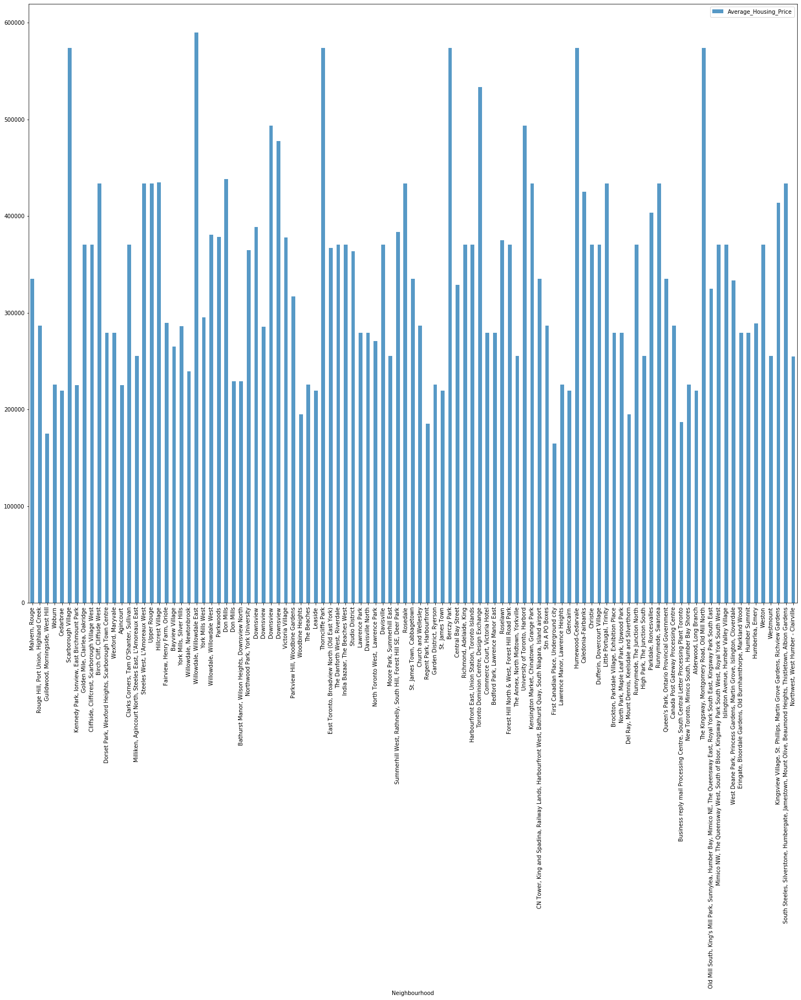

In [81]:
scarborough_avg_houseprice.plot(kind='bar',figsize=(25,20),alpha=0.75)

#### Conclusion
In this project, I explored different neighbourhoods in Scarborough and clustered them into 10 different clusters using the k-Means clustering algorithm. I then used a bar graph to show the different house prices of each neighbourhood, because it is often a determining factor for where to stay.